In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
ls

data_df.csv  gdrive/  masked_df.csv  sample_data/


## **Importing Necessary Libraries**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
import os
import cv2
from tqdm import tqdm_notebook as tqdm
import seaborn as sns
import joblib
import warnings
import math
import pickle as pk
import datetime
import albumentations
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from imageio import imread
import imageio
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import layers,Model,Sequential
from tensorflow.keras.layers import Dropout,Activation,InputLayer,LSTM,GRU,Bidirectional,TimeDistributed,Flatten,Dense,BatchNormalization,MaxPooling2D,Conv2D,Input,Concatenate,LeakyReLU
warnings.filterwarnings('ignore')
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.layers import concatenate, add
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import to_categorical

## **Loading the Dataset**

In [ ]:
import os

PATH = '/content/gdrive/MyDrive/phase-01-training/dataset-dist/phase-01/training/'

filenames = [name for name in os.listdir(PATH) if os.path.splitext(name)[-1] == '.png']

In [ ]:
DATASET_PATHS = {
    'real': 'pristine',
    'fake': 'fake'
}

In [ ]:
masked_dict  = {'name':[],'height':[], 'width':[], 'channels':[]}
data_dict = {'name':[],'height':[], 'width':[], 'channels':[],'label':[]}

In [ ]:
for path in DATASET_PATHS:
    for image in tqdm(os.listdir(PATH+DATASET_PATHS[path])):
        if image.split('.')[-2]=='mask':
            img = imread(PATH+DATASET_PATHS[path]+'/'+image)
            if len(img.shape)==2:
                height, width = img.shape
                channels = 1
            else:
                height, width, channels = img.shape
            masked_dict['name'].append(image)
            masked_dict['height'].append(height)
            masked_dict['width'].append(width)
            masked_dict['channels'].append(channels)
        else:
            try:
                img = imread(PATH+DATASET_PATHS[path]+'/'+image)
                if len(img.shape)==2:
                    height, width = img.shape
                    channels = 1
                else:
                    height, width, channels = img.shape
            except:
                pass
            data_dict['name'].append(image)
            data_dict['height'].append(height)
            data_dict['width'].append(width)
            data_dict['channels'].append(channels)
            data_dict['label'].append(DATASET_PATHS[path])

  0%|          | 0/1050 [00:00<?, ?it/s]

  0%|          | 0/903 [00:00<?, ?it/s]

In [ ]:
data_df = pd.DataFrame.from_dict(data_dict)
masked_df = pd.DataFrame.from_dict(masked_dict)

In [ ]:
masked_df.head()

,name,height,width,channels
0,cab8ac89fc001f1adb2ff4d8b3f9f9a9.mask.png,3240,4320,3
1,ab9bc082d5fe5d5835be9596b3bbd28c.mask.png,768,1024,1
2,cebf26e8911e2a38c273b1c015e61fcd.mask.png,768,1024,1
3,30096e4b0cdadb88b548f4fa2aee4b95.mask.png,1536,2048,4
4,ae9e681d29a063fd86265c1182b64f52.mask.png,768,1024,1


In [ ]:
data_df.head()

,name,height,width,channels,label
0,05e01acb088c8953c413624801bb39c0.png,768,1024,3,pristine
1,1d23dbb0c4fccc0a7cf1d0a64ebb538f.png,768,1024,3,pristine
2,6f00afc2519fccc5c4b3bd1896f01796.png,768,1024,3,pristine
3,3f34a7d6c4b3e5b36f40fc178e7e656c.png,768,1024,3,pristine
4,0ffbb259fb2cd7aeb3ba5f0297fdaf7e.png,768,1024,3,pristine


## **Checking for Duplicate Images**

In [ ]:
data_df.duplicated().any()

False

In [ ]:
masked_df.duplicated().any()

False

In [ ]:
masked_df= masked_df.to_csv('masked_df.csv', index=False)
data_df= data_df.to_csv('data_df.csv',index=False)

In [ ]:
masked_df=pd.read_csv('masked_df.csv')
data_df=pd.read_csv('data_df.csv')

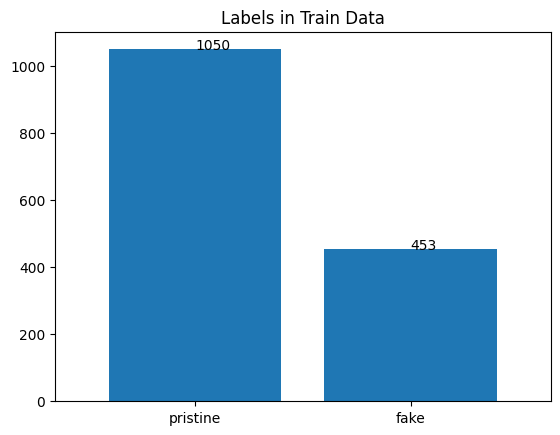

In [ ]:
lables= data_df['label'].value_counts()
ax=lables.plot.bar(width=.8,title='Labels in Train Data', rot=0)
for i, v in lables.reset_index().iterrows():
    ax.text(i, v.label, v.label)

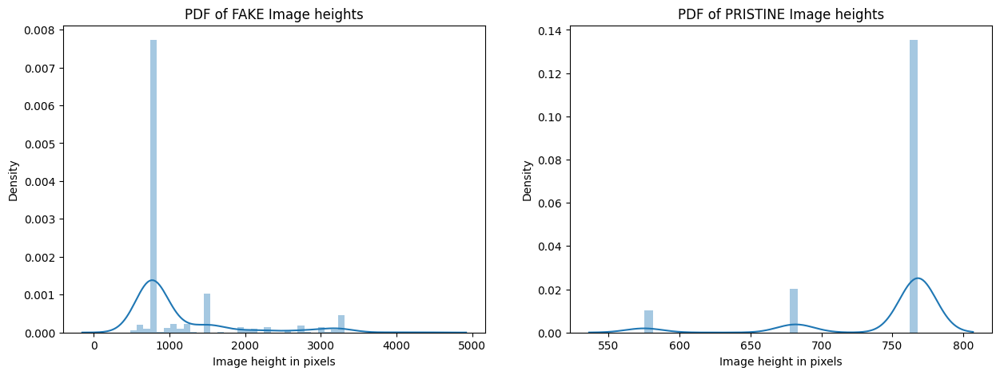

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
ax[0].set_title('PDF of FAKE Image heights')
sns.distplot(data_df[data_df['label']=='fake'].height,ax=ax[0])
ax[0].set_xlabel("Image height in pixels")
#sns.distplot(data_df[data_df['label']=='pristine'].height)
ax[0].set_xlabel("Image height in pixels")
sns.distplot(data_df[data_df['label']=='pristine'].height,ax=ax[1])
#sns.distplot(data_df[data_df['label']=='pristine'].height)
ax[1].set_xlabel("Image height in pixels")
ax[1].set_title('PDF of PRISTINE Image heights')
plt.show()

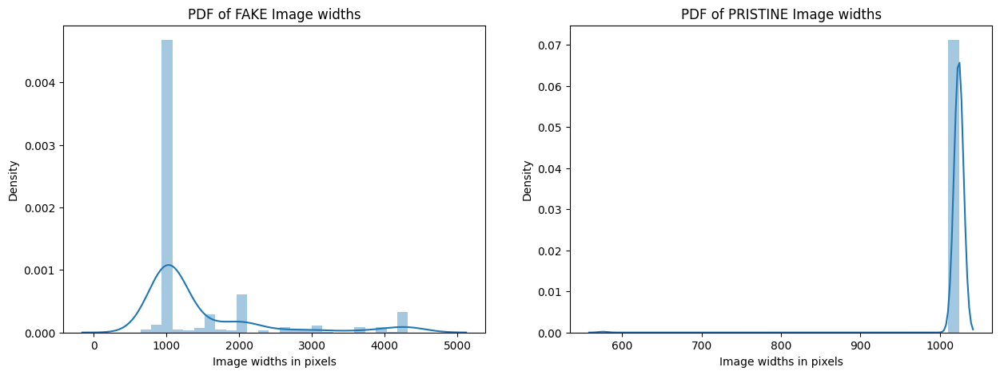

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
ax[0].set_title('PDF of FAKE Image widths')
sns.distplot(data_df[data_df['label']=='fake'].width,ax=ax[0])
ax[0].set_xlabel("Image widths in pixels")
ax[0].set_xlabel("Image widths in pixels")
sns.distplot(data_df[data_df['label']=='pristine'].width,ax=ax[1])
ax[1].set_xlabel("Image widths in pixels")
ax[1].set_title('PDF of PRISTINE Image widths')
plt.show()

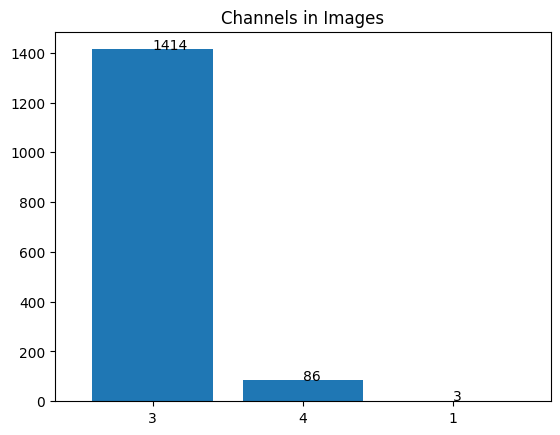

In [ ]:
lables= data_df['channels'].value_counts()
ax=lables.plot.bar(width=.8,title='Channels in Images', rot=0)
for i, v in lables.reset_index().iterrows():
    ax.text(i, v.channels, v.channels)

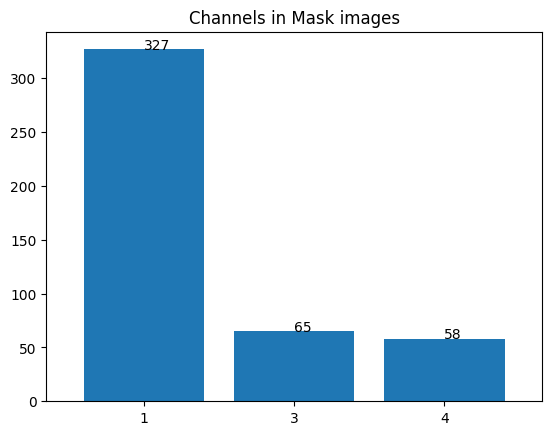

In [ ]:
lables= masked_df['channels'].value_counts()
ax=lables.plot.bar(width=.8,title='Channels in Mask images', rot=0)
for i, v in lables.reset_index().iterrows():
    ax.text(i, v.channels, v.channels)

## **Sample Images from Dataset**

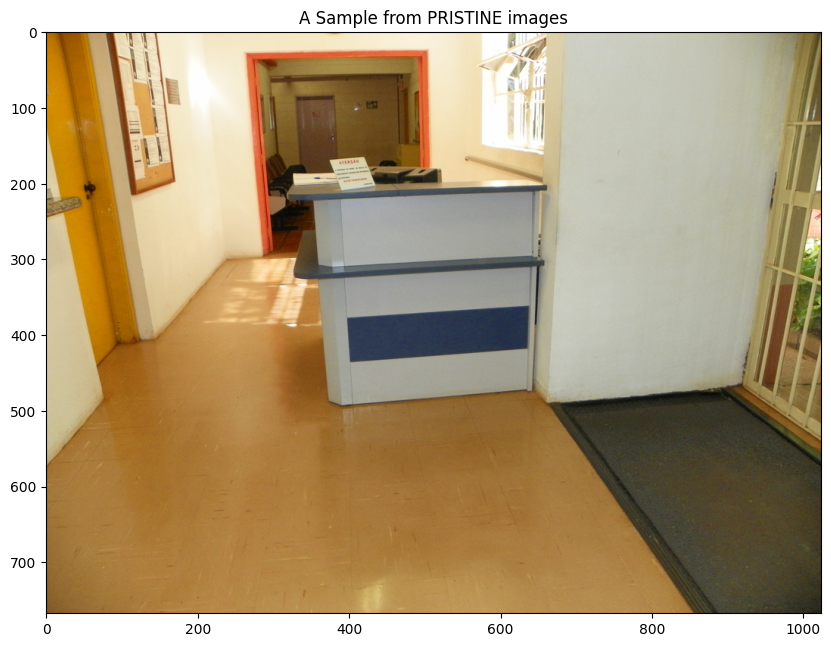

In [ ]:
plt.figure(figsize=(10,10))
image = imread(PATH+'pristine'+'/'+(data_df[data_df.label=='pristine']['name']).iloc[120])
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.title('A Sample from PRISTINE images')
plt.show()

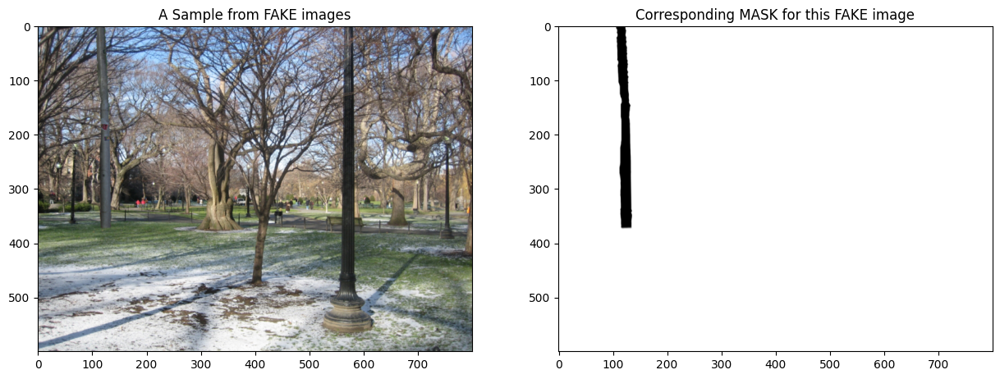

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(15,15))
index = 16
image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index])
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask_image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
#mask_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2RGB)
ax[0].imshow(image)
ax[1].imshow(mask_image,cmap='gray')
ax[0].set_title('A Sample from FAKE images')
ax[1].set_title('Corresponding MASK for this FAKE image')
plt.show()

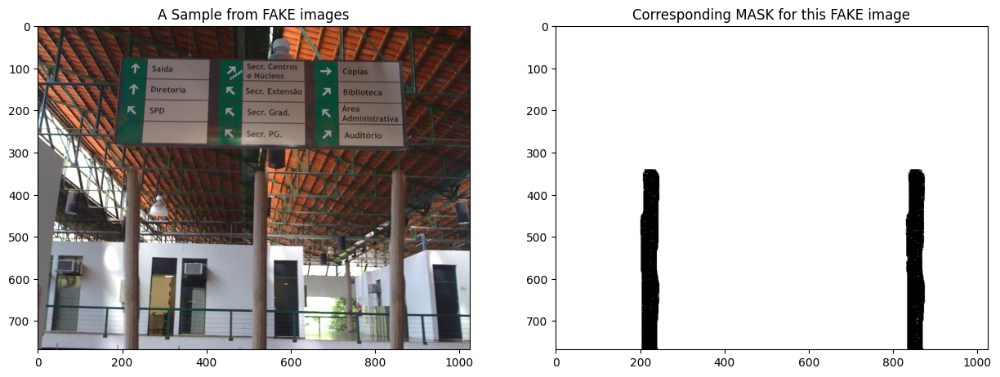

In [ ]:
index = 300
fig, ax = plt.subplots(1,2,figsize=(15,15))
image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index])
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask_image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
#mask_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2RGB)
ax[0].imshow(image)
ax[1].imshow(mask_image,cmap='gray')
ax[0].set_title('A Sample from FAKE images')
ax[1].set_title('Corresponding MASK for this FAKE image')
plt.show()

In [ ]:
data_df= pd.read_csv('data_df.csv')
masked_df= pd.read_csv('masked_df.csv')

In [ ]:
print("Total FAKE images in the data: {}".format(len(set(list(data_df[data_df.label=='fake']['name'])))))
print("Total availble Masks for the data: {}".format(len(set(list(masked_df['name'])))))

Total FAKE images in the data: 453
Total availble Masks for the data: 450


In [ ]:
fake_names = list(set([i.split('.')[0] for i in list(masked_df['name'])]) & set([i.split('.')[0] for i in list(data_df[data_df.label=='fake']['name'])]))

In [ ]:
print("Total intersection of Masks and FAKE images in the data: {}".format(len(fake_names)))

Total intersection of Masks and FAKE images in the data: 450


In [ ]:
delete_these = []
for image in fake_names:
    mask_img = cv2.imread(PATH+'fake'+'/'+image+'.mask.png')
    fake_img = cv2.imread(PATH+'fake'+'/'+image+'.png')
    if mask_img.shape[:2]!= fake_img.shape[:2]:
        delete_these.append(image)
delete_these

['bb7ed6b43f565a1fe2ebcbf99886d1d4',
 'd9b9f5db7d29a3855cceef574145b595',
 'cc263a4c9ff9943acbb9049f637a0bed',
 'aa3b4f7caf9de8c1d6551c33045fb4c1',
 'd4aff0ad5f4f99fc6cad4243b926eda7',
 'bc04da26ab41ce92565dd3c686dae6c8',
 'b0060704d02f1229b75cbd550c7267b4',
 'ca472f184807aded538221ac0b5ac27b']

In [ ]:
fake_names=list(set(fake_names)-set(delete_these))
print("Total valid masks are :{}".format(len(fake_names)))

Total valid masks are :442


## Creating Binary Masks -  Removing the noise in Mask images

> Indented block



In [ ]:
dest_path = PATH+'binary_masks/'
os.makedirs(dest_path, exist_ok=True)
bin_masks =[]
for mask in tqdm(fake_names):
    mask_img = cv2.imread(PATH+'fake'+'/'+mask+'.mask.png')[:,:,:1]
    #mask_img= cv2.cvtColor(mask_img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(mask_img,(5,5),0) #Adding gaussian blur
    ret,bin_mask = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU) #modifing the values to either 0 or 255
    cv2.imwrite(dest_path+mask+'.mask.png',bin_mask)
    bin_masks.append(bin_mask)

  0%|          | 0/442 [00:00<?, ?it/s]

In [ ]:
import os
files = os.listdir(PATH+'binary_masks/')
print(files)



['add77a1c9b7aa95a65542a01a209b7d2.mask.png', 'c328943933b839c4f9d2d0c94a831eab.mask.png', 'ac23beb47b46fdc24e2f381be0aa6762.mask.png', '8812398ed09ccb906f4e0d608aec0913.mask.png', 'af77345bcf2cfcb77f0aa3eb0d724e98.mask.png', 'b318ed71fdddcabf17e15c6ca3af13af.mask.png', '010543abfbd0db1e9aa1b24604336e0c.mask.png', '8403960a267cea6cec8473736454c4bd.mask.png', 'dcc2c41c810408c4cb08ce092a712d02.mask.png', 'a464044a6cdff5cff44d099a99138ae2.mask.png', 'a607a69c1d589cf0e9d24ff6162abf01.mask.png', 'c88f1d27e73aaec5556fcd439600879f.mask.png', 'd4e7b59257c600b426046bed3a7da516.mask.png', 'b0daf1c4142d7b73cd76d39e7c36a7c2.mask.png', 'bfd1934c21fe48a0e3ad8e9695473cb8.mask.png', 'c4249fa108dfc8cc6617d0c03adaa9e4.mask.png', '906607152d984039c6baebdf6fa15c40.mask.png', 'ad0018fb4cec9dc007f89d94902d1bf1.mask.png', 'bcbc7bef972e1b0ad0ebf8d4781aba31.mask.png', 'b37a15fd949a331a8aca247b7ca34f2d.mask.png', 'bedffe5f780e3c2be2cc032450ce0800.mask.png', 'f0e435860a2dc27294bf153d56351b27.mask.png', 'ae9dbc1d

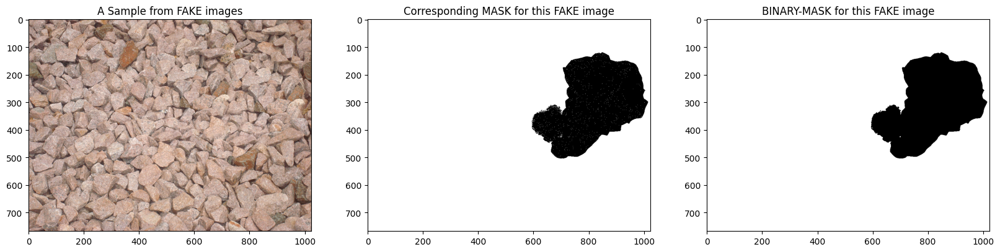

In [ ]:
index = 100
fig, ax = plt.subplots(1,3,figsize=(20,20))
image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index])
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask_image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
#mask_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2RGB)
bin_mask = imread(PATH+'binary_masks/'+(data_df[data_df.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
#bin_mask = cv2.cvtColor(bin_mask, cv2.COLOR_BGR2GRAY)
ax[0].imshow(image)
ax[1].imshow(mask_image,cmap='gray')
ax[2].imshow(bin_mask,cmap='gray')
ax[0].set_title('A Sample from FAKE images')
ax[1].set_title('Corresponding MASK for this FAKE image')
ax[2].set_title('BINARY-MASK for this FAKE image')
plt.show()

# New section

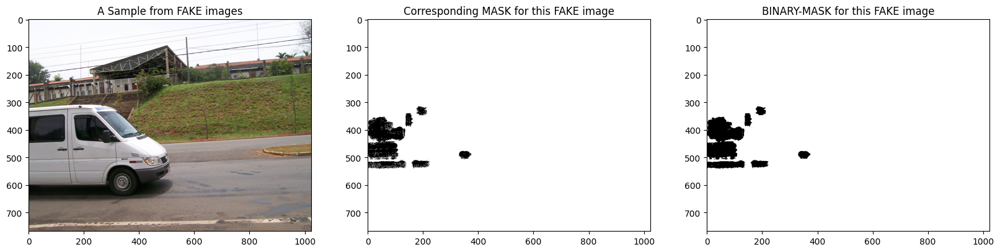

In [ ]:
index = 210
fig, ax = plt.subplots(1,3,figsize=(20,20))
image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index])
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask_image = imread(PATH+'fake'+'/'+(data_df[data_df.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
#mask_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2RGB)
bin_mask = imread(PATH+'binary_masks/'+(data_df[data_df.label=='fake']['name']).iloc[index].split('.')[0]+'.mask.png')
#bin_mask = cv2.cvtColor(bin_mask, cv2.COLOR_BGR2GRAY)
ax[0].imshow(image)
ax[1].imshow(mask_image,cmap='gray')
ax[2].imshow(bin_mask,cmap='gray')
ax[0].set_title('A Sample from FAKE images')
ax[1].set_title('Corresponding MASK for this FAKE image')
ax[2].set_title('BINARY-MASK for this FAKE image')
plt.show()

In [ ]:
fake_names[:5]

['87238ad60578291fff62151eb6618adb',
 'be015078936ab89c8c755cf290ba9a0f',
 '906607152d984039c6baebdf6fa15c40',
 'e2a45c5c31400c8a16df285a45be6900',
 'aebfa7ea3c777f775f7185c04c6a8fab']

In [ ]:
fake_names_df = pd.DataFrame([i+'.png' for i in fake_names],columns=['name'])
data_df_real = data_df[data_df.label == 'pristine']
data_df_fake = data_df[data_df.label == 'fake']
+++

In [ ]:
data_df_fake = data_df_fake.join(fake_names_df.set_index('name'), on='name',how='right')

In [ ]:
data_df_final = pd.concat([data_df_real, data_df_fake], ignore_index=True)

In [ ]:
data_df_final.head()

,name,height,width,channels,label
0,05e01acb088c8953c413624801bb39c0.png,768,1024,3,pristine
1,1d23dbb0c4fccc0a7cf1d0a64ebb538f.png,768,1024,3,pristine
2,6f00afc2519fccc5c4b3bd1896f01796.png,768,1024,3,pristine
3,3f34a7d6c4b3e5b36f40fc178e7e656c.png,768,1024,3,pristine
4,0ffbb259fb2cd7aeb3ba5f0297fdaf7e.png,768,1024,3,pristine


In [ ]:
data_df_final.to_csv('data_df_final.csv',index=False)

## **Comparing fake and pristine labels in the dataset**

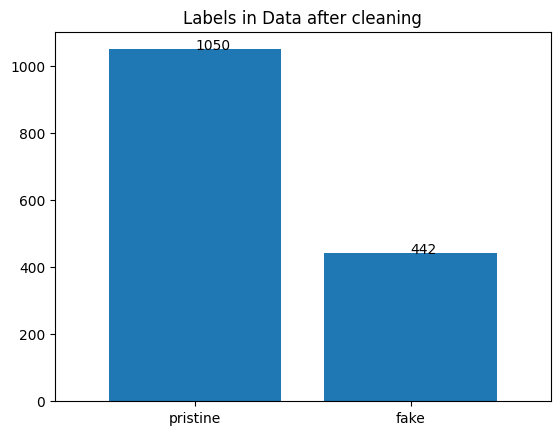

In [ ]:
lables= data_df_final['label'].value_counts()
ax=lables.plot.bar(width=.8,title='Labels in Data after cleaning', rot=0)
for i, v in lables.reset_index().iterrows():
    ax.text(i, v.label, v.label)

## **Train and Test Splitting before Augmentation**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(data_df_final[['channels', 'height', 'name', 'width','label']],
                                                    data_df_final['label'],
                                                    test_size=0.2,
                                                    stratify=data_df_final['label'],
                                                    random_state=42)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_train[['channels', 'height', 'name', 'width','label']],
                                                  y_train, test_size=0.2, stratify=y_train,random_state=42)

In [ ]:
print("........Data splits before the Agumentation...........")
print("Images in Train data before sampling: {} ".format(X_train.shape[0]))
print("Images in Test data  before sampling: {} ".format(X_test.shape[0]))
print("Images in Validation data before sampling: {} ".format(X_val.shape[0]))

........Data splits before the Agumentation...........
Images in Train data before sampling: 954 
Images in Test data  before sampling: 299 
Images in Validation data before sampling: 239 


In [ ]:
X_train= X_train.to_csv('X_train.csv', index=False)
X_test= X_test.to_csv('X_test.csv', index=False)
X_val= X_val.to_csv('X_val.csv', index=False)

In [ ]:
X_train= pd.read_csv("X_train.csv")
X_test= pd.read_csv("X_test.csv")
X_val= pd.read_csv("X_val.csv")

In [ ]:
X_train.head()

,channels,height,name,width,label
0,4,768,3de6cffce5e0922289bc60c4928acc83.png,1024,pristine
1,3,768,0e73727abe5eef1591b5828648e70287.png,1024,pristine
2,3,768,0cb63a63de368044d42c739f42623289.png,1024,pristine
3,3,768,5b395b33770bb1171248496e5b6fef3e.png,1024,pristine
4,3,683,0dc12943c6309b600bc65a573acad99d.png,1024,pristine


In [ ]:
from albumentations import (
PadIfNeeded,
HorizontalFlip,
VerticalFlip,
Transpose,
ElasticTransform,
GridDistortion,
OpticalDistortion,
RandomBrightnessContrast,
RandomGamma,Resize
)

## **Data Augmentation**

In [ ]:
def agument(aug,image,mask):
    """This function will apply the type of augmentation on both image and mask
    returns augmented image and its augmented mask
    """
    augmented = aug(image=image, mask=mask)
    return augmented['image'],augmented['mask']


# All these below functions defines the different agumentations types.

def resize(image,mask): #While agumenting the data we are converting all images into the size of (512,512)
    aug = Resize(height=512,width=512,p=1)
    return agument(aug,image,mask)

def horizontalFlip(image,mask):
    aug = HorizontalFlip(p=1)
    return agument(aug,image,mask)

def verticalFlip(image,mask):
    aug = VerticalFlip(p=1)
    return agument(aug,image,mask)

def transpose(image,mask):
    aug = Transpose(p=1)
    return agument(aug,image,mask)

#def hueSaturationValue(image,mask):
    #aug = HueSaturationValue(p=1,hue_shift_limit=100, sat_shift_limit=100, val_shift_limit=50)
    #return agument(aug,image,mask)

def elasticTransform(image,mask):
    aug = ElasticTransform(p=1)
    return agument(aug,image,mask)

def opticalDistortion(image,mask):
    aug = OpticalDistortion(p=1, distort_limit=3, shift_limit=0.4)
    return agument(aug,image,mask)

def randomBrightnessContrast(image,mask):
    aug =RandomBrightnessContrast(p=1,brightness_limit=0.5, contrast_limit=0.4)
    return agument(aug,image,mask)

## **Sample of Augmentated Images**

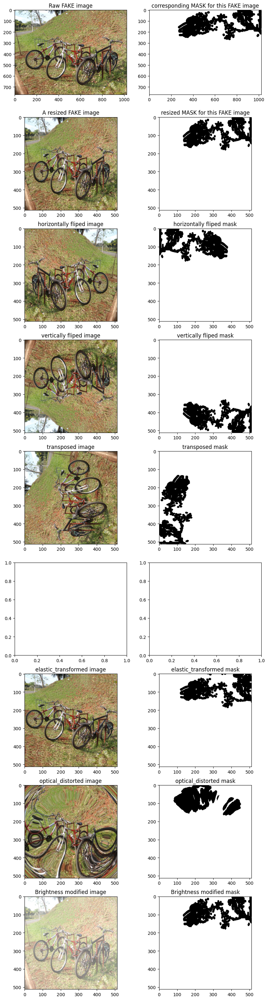

In [ ]:
index=31
fig, ax = plt.subplots(9,2,figsize=(10,40))
image_raw= imread(PATH+'fake/'+X_train[X_train['label']=='fake']['name'].iloc[index])
mask_raw = imread(PATH+'binary_masks/'+X_train[X_train['label']=='fake']['name'].iloc[index].split('.')[0]+'.mask.png')

image,mask= resize(image=image_raw,mask=mask_raw)
image_h,mask_h= horizontalFlip(image=image,mask=mask)
image_v,mask_v= verticalFlip(image=image,mask=mask)
image_t,mask_t= transpose(image=image,mask=mask)
#image_hue,mask_hue= hueSaturationValue(image=image,mask=mask)
image_elt,mask_elt= elasticTransform(image=image,mask=mask)
image_opt,mask_opt= opticalDistortion(image=image,mask=mask)
image_rbc,mask_rbc= randomBrightnessContrast(image=image,mask=mask)

ax[0][0].imshow(image_raw)
ax[0][1].imshow(mask_raw,cmap='gray')
ax[0][0].set_title('Raw FAKE image')
ax[0][1].set_title('corresponding MASK for this FAKE image')
ax[1][0].imshow(image)
ax[1][1].imshow(mask,cmap='gray')
ax[1][0].set_title('A resized FAKE image')
ax[1][1].set_title('resized MASK for this FAKE image')
ax[2][0].imshow(image_h)
ax[2][1].imshow(mask_h,cmap='gray')
ax[2][0].set_title('horizontally fliped image')
ax[2][1].set_title('horizontally fliped mask')
ax[3][0].imshow(image_v)
ax[3][1].imshow(mask_v,cmap='gray')
ax[3][0].set_title('vertically fliped image')
ax[3][1].set_title('vertically fliped mask')
ax[4][0].imshow(image_t)
ax[4][1].imshow(mask_t,cmap='gray')
ax[4][0].set_title('transposed image')
ax[4][1].set_title('transposed mask')
#ax[5][0].imshow(image_hue)
#ax[5][1].imshow(mask_hue,cmap='gray')
#ax[5][0].set_title('hue shifted image')
#ax[5][1].set_title('hue shifted mask')
ax[6][0].imshow(image_elt)
ax[6][1].imshow(mask_elt,cmap='gray')
ax[6][0].set_title('elastic_transformed image')
ax[6][1].set_title('elastic_transformed mask')
ax[7][0].imshow(image_opt)
ax[7][1].imshow(mask_opt,cmap='gray')
ax[7][0].set_title('optical_distorted image')
ax[7][1].set_title('optical_distorted mask')
ax[8][0].imshow(image_rbc)
ax[8][1].imshow(mask_rbc,cmap='gray')
ax[8][0].set_title('Brightness modified image')
ax[8][1].set_title('Brightness modified mask')
plt.show()

In [ ]:
train_path_fk = 'data_agumented/train/fake/'
test_path_fk = 'data_agumented/test/fake/'
val_path_fk = 'data_agumented/val/fake/'
os.makedirs(train_path_fk,exist_ok=True)
os.makedirs(test_path_fk,exist_ok=True)
os.makedirs(val_path_fk,exist_ok=True)

In [ ]:
def DataAgument(split_type,Type):
    """Function will accept the data in "split_type" and name of the split in "Type"
     From the data, it will take only FAKE images and its masks.
    for each fake image:
        1. It will resizes the image and its mask
        2. And apply 6 kinds of agumentations
        3. Finally saves the agumented images and masks

    """
    for name in tqdm(split_type[split_type['label']=='fake']['name']):
        name_path = PATH+'fake/'+str(name)
        image_raw= imread(name_path)
        mask_raw = imread(PATH+'binary_masks/'+name.split('.')[0]+'.mask.png')
        image_0,mask_0= resize(image=image_raw,mask=mask_raw)
        image_1,mask_1= horizontalFlip(image=image_0,mask=mask_0)
        image_2,mask_2= verticalFlip(image=image_0,mask=mask_0)
        image_3,mask_3= transpose(image=image_0,mask=mask_0)
        #image_4,mask_4= hueSaturationValue(image=image_0,mask=mask_0)
        image_5,mask_5= elasticTransform(image=image_0,mask=mask_0)
        image_6,mask_6= opticalDistortion(image=image_0,mask=mask_0)
        image_7,mask_7= randomBrightnessContrast(image=image_0,mask=mask_0)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(0)+'.png',image_0)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(0)+'.mask.png',mask_0)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(1)+'.png',image_1)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(1)+'.mask.png',mask_1)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(2)+'.png',image_2)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(2)+'.mask.png',mask_2)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(3)+'.png',image_3)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(3)+'.mask.png',mask_3)
        #cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(4)+'.png',image_4)
        #cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(4)+'.mask.png',mask_4)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(5)+'.png',image_5)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(5)+'.mask.png',mask_5)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(6)+'.png',image_6)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(6)+'.mask.png',mask_6)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(7)+'.png',image_7)
        cv2.imwrite('data_agumented/'+Type+'/fake/'+name.split('.')[0]+'_'+str(7)+'.mask.png',mask_7)

In [ ]:
DataAgument(split_type=X_train,Type="train")
DataAgument(split_type=X_test,Type="test")
DataAgument(split_type=X_val,Type="val")

  0%|          | 0/282 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

In [ ]:
print("Total agumented FAKE images from TRIAN Split: {}".format(len(os.listdir(train_path_fk))/2))
print("Total agumented FAKE images from TEST Split: {}".format(len(os.listdir(test_path_fk))/2))
print("Total agumented FAKE images from VALIDATION Split: {}".format(len(os.listdir(val_path_fk))/2))

Total agumented FAKE images from TRIAN Split: 1974.0
Total agumented FAKE images from TEST Split: 623.0
Total agumented FAKE images from VALIDATION Split: 497.0


In [ ]:
train_path_pr = 'data_agumented/train/pristine/'
test_path_pr = 'data_agumented/test/pristine/'
val_path_pr = 'data_agumented/val/pristine/'
os.makedirs(train_path_pr,exist_ok=True)
os.makedirs(test_path_pr,exist_ok=True)
os.makedirs(val_path_pr,exist_ok=True)

In [ ]:
#Default white mask with same size as image size which is same for all pristine images
cv2.imwrite("default.mask.png",np.zeros((512,512))+255)

True

In [ ]:
def DataAgument_pristine(split_type,Type):
        """Function will accept the data in "split_type" and name of the split in "Type"
     From the data, it will take only PRISTINE images and its masks.
    for each fake image:
        1. It will resizes the image and its mask
        2. And apply 2 kinds of agumentations // (Already PRISTINE images are large in size hence limiting to only 2 agumentations
        3. Finally saves the agumented images and masks

    """
        for name in tqdm(split_type[split_type['label']=='pristine']['name']):
            name_path = PATH+'pristine/'+str(name)
            image_raw= imread(name_path)
            mask_raw= imread('default.mask.png')
            image_0,mask_0= resize(image=image_raw,mask=mask_raw)
            image_1,mask_1= verticalFlip(image=image_0,mask=mask_raw)
            #image_2,mask_2= hueSaturationValue(image=image_0,mask=mask_raw)
            image_2,mask_2= opticalDistortion(image=image_0,mask=mask_raw)
            cv2.imwrite('data_agumented/'+Type+'/pristine/'+name.split('.')[0]+'_'+str(0)+'.png',image_0)
            cv2.imwrite('data_agumented/'+Type+'/pristine/'+name.split('.')[0]+'_'+str(1)+'.png',image_1)
            #cv2.imwrite('data_agumented/'+Type+'/pristine/'+name.split('.')[0]+'_'+str(2)+'.png',image_2)
            cv2.imwrite('data_agumented/'+Type+'/pristine/'+name.split('.')[0]+'_'+str(3)+'.png',image_2)

In [ ]:
DataAgument_pristine(split_type=X_train,Type="train")
DataAgument_pristine(split_type=X_test,Type="test")
DataAgument_pristine(split_type=X_val,Type="val")

  0%|          | 0/672 [00:00<?, ?it/s]

  0%|          | 0/210 [00:00<?, ?it/s]

  0%|          | 0/168 [00:00<?, ?it/s]

In [ ]:
print("Total agumented FAKE images from TRIAN Split: {}".format(len(os.listdir(train_path_fk))/2))
print("Total agumented FAKE images from TEST Split: {}".format(len(os.listdir(test_path_fk))/2))
print("Total agumented FAKE images from VALIDATION Split: {}".format(len(os.listdir(val_path_fk))/2))

Total agumented FAKE images from TRIAN Split: 1974.0
Total agumented FAKE images from TEST Split: 623.0
Total agumented FAKE images from VALIDATION Split: 497.0


In [ ]:
print("Total agumented Pristine images from TRIAN Split: {}".format(len(os.listdir(train_path_pr))))
print("Total agumented Pristine images from TEST Split: {}".format(len(os.listdir(test_path_pr))))
print("Total agumented Pristine images from VALIDATION Split: {}".format(len(os.listdir(val_path_pr))))

Total agumented Pristine images from TRIAN Split: 2016
Total agumented Pristine images from TEST Split: 630
Total agumented Pristine images from VALIDATION Split: 504


In [ ]:
train_path_fk = 'data_agumented/train/fake/'
test_path_fk = 'data_agumented/test/fake/'
val_path_fk = 'data_agumented/val/fake/'
train_path_pr = 'data_agumented/train/pristine/'
test_path_pr = 'data_agumented/test/pristine/'
val_path_pr = 'data_agumented/val/pristine/'

## **Splitting data into train,test and validation sets**

In [ ]:
train_data = pd.DataFrame()
X_label = []
y_label = []
for i in (list({i.split('.')[0] for i in os.listdir(train_path_fk)})):
    X_label.append(train_path_fk+i+'.png')
    y_label.append(train_path_fk+i+'.mask.png')
for i in (list({i.split('.')[0] for i in os.listdir(train_path_pr)})):
    X_label.append(train_path_pr+i+'.png')
    y_label.append('default.mask.png')

train_data['X']  =  X_label
train_data['y']  =  y_label
train_data = shuffle(train_data)
train_data.reset_index(inplace=True, drop=True)
train_data.head()

,X,y
0,data_agumented/train/fake/a0e0f77ac21b8677c261...,data_agumented/train/fake/a0e0f77ac21b8677c261...
1,data_agumented/train/pristine/0ffbb259fb2cd7ae...,default.mask.png
2,data_agumented/train/pristine/6fb1f8729a7064e5...,default.mask.png
3,data_agumented/train/pristine/5d5091a5871fb60d...,default.mask.png
4,data_agumented/train/fake/c0200dcf86e0c83a600e...,data_agumented/train/fake/c0200dcf86e0c83a600e...


In [ ]:
train_data.shape

(3990, 2)

In [ ]:
test_data = pd.DataFrame()
X_label = []
y_label = []
for i in (list({i.split('.')[0] for i in os.listdir(test_path_fk)})):
    X_label.append(test_path_fk+i+'.png')
    y_label.append(test_path_fk+i+'.mask.png')
for i in (list({i.split('.')[0] for i in os.listdir(test_path_pr)})):
    X_label.append(test_path_pr+i+'.png')
    y_label.append('default.mask.png')

test_data['X']  =  X_label
test_data['y']  =  y_label
test_data = shuffle(test_data)
test_data.reset_index(inplace=True, drop=True)
test_data.head()

,X,y
0,data_agumented/test/pristine/4a4213fbf0ce85b8b...,default.mask.png
1,data_agumented/test/fake/ce05c962f695932a830ad...,data_agumented/test/fake/ce05c962f695932a830ad...
2,data_agumented/test/fake/c890621aeaafe9b0e353f...,data_agumented/test/fake/c890621aeaafe9b0e353f...
3,data_agumented/test/pristine/0df10c08b8122da42...,default.mask.png
4,data_agumented/test/pristine/3b4970c11d7216bba...,default.mask.png


In [ ]:
test_data.shape

(1253, 2)

In [ ]:
val_data = pd.DataFrame()
X_label = []
y_label = []
for i in (list({i.split('.')[0] for i in os.listdir(val_path_fk)})):
    X_label.append(val_path_fk+i+'.png')
    y_label.append(val_path_fk+i+'.mask.png')
for i in (list({i.split('.')[0] for i in os.listdir(val_path_pr)})):
    X_label.append(val_path_pr+i+'.png')
    y_label.append('default.mask.png')

val_data['X']  =  X_label
val_data['y']  =  y_label
val_data = shuffle(val_data)
val_data.reset_index(inplace=True, drop=True)
val_data.head()

,X,y
0,data_agumented/val/pristine/5e0ec5fcdcd772e881...,default.mask.png
1,data_agumented/val/fake/c9699a289977ce2d80c6e0...,data_agumented/val/fake/c9699a289977ce2d80c6e0...
2,data_agumented/val/fake/e7b762a90a95ff8d71497a...,data_agumented/val/fake/e7b762a90a95ff8d71497a...
3,data_agumented/val/fake/d13e3749938f9bcd3945be...,data_agumented/val/fake/d13e3749938f9bcd3945be...
4,data_agumented/val/fake/966360f61a4e1d058f7100...,data_agumented/val/fake/966360f61a4e1d058f7100...


In [ ]:
train_data.to_csv('train_data.csv',index="False")
test_data.to_csv('test_data.csv',index="False")
val_data.to_csv('val_data.csv',index="False")

In [ ]:
train_data=pd.read_csv('train_data.csv')
test_data=pd.read_csv('test_data.csv')
val_data=pd.read_csv('val_data.csv')

## **Model Building**

In [ ]:
def data_gen(data):
    while True:
        for start in range(0, data.shape[0], batch_size):
            x_batch = []
            y_batch = []
            end = min(start + batch_size, data.shape[0])
            x_data_batch = data.iloc[start:end]

            for index,row in x_data_batch.iterrows():
                image = load_img(row['X'])
                image = img_to_array(image)
                mask = imread(row['y'])
                mask= img_to_array(mask,dtype=np.uint8)
                x_batch.append(image)
                y_batch.append(mask)

            x_batch = np.array(x_batch).reshape(-1, 512, 512, 3)/255
            y_batch = np.array(y_batch)/255
            yield x_batch, y_batch


In [ ]:
#Ref : https://www.depends-on-the-definition.com/unet-keras-segmenting-images/

def conv2d_block(input_tensor, n_filters, kernel_size=3, batchnorm=True):
    # first layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    # second layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(x)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x

In [ ]:
def get_unet(input_img, n_filters=16, dropout=0.5, batchnorm=True):
    # contracting path
    c1 = conv2d_block(input_img, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    p1 = MaxPooling2D((2, 2)) (c1)
    p1 = Dropout(dropout*0.5)(p1)

    c2 = conv2d_block(p1, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)
    p2 = MaxPooling2D((2, 2)) (c2)
    p2 = Dropout(dropout)(p2)

    c3 = conv2d_block(p2, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)
    p3 = MaxPooling2D((2, 2)) (c3)
    p3 = Dropout(dropout)(p3)

    c4 = conv2d_block(p3, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)
    p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
    p4 = Dropout(dropout)(p4)

    c5 = conv2d_block(p4, n_filters=n_filters*16, kernel_size=3, batchnorm=batchnorm)

    # expansive path
    u6 = Conv2DTranspose(n_filters*8, (3, 3), strides=(2, 2), padding='same') (c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)

    u7 = Conv2DTranspose(n_filters*4, (3, 3), strides=(2, 2), padding='same') (c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)

    u8 = Conv2DTranspose(n_filters*2, (3, 3), strides=(2, 2), padding='same') (c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)

    u9 = Conv2DTranspose(n_filters*1, (3, 3), strides=(2, 2), padding='same') (c8)
    u9 = concatenate([u9, c1], axis=3)
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)

    outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

In [ ]:
input_img = Input((512, 512, 3))
model_unet = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)

model_unet.compile(optimizer='adam', loss="binary_crossentropy", metrics=["accuracy"])
model_unet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 16  448         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
checkPoint_path = "model_checkpoints/model_unet/"
filepath= checkPoint_path+"weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"

checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

log_dir = "C:\\logs\\model_unet\\" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=3)

callbacks_list = [checkpoint,tensorboard_callback]

In [ ]:
batch_size = 16
max_epochs = 10
input_size = 512

history = model_unet.fit(x = data_gen(train_data),
                    steps_per_epoch=16,
                    epochs=max_epochs,
                    validation_data=data_gen(val_data),
                    validation_steps=16,
                    callbacks=callbacks_list)

Epoch 1/10
16/16 [==============================] - ETA: 0s - loss: 0.5170 - accuracy: 0.8683
Epoch 1: val_accuracy improved from -inf to 0.57301, saving model to model_checkpoints/model_unet/weights-improvement-01-0.57.hdf5
16/16 [==============================] - 63s 2s/step - loss: 0.5170 - accuracy: 0.8683 - val_loss: 0.7816 - val_accuracy: 0.5730
Epoch 2/10
16/16 [==============================] - ETA: 0s - loss: 0.3807 - accuracy: 0.9622
Epoch 2: val_accuracy improved from 0.57301 to 0.58031, saving model to model_checkpoints/model_unet/weights-improvement-02-0.58.hdf5
16/16 [==============================] - 23s 1s/step - loss: 0.3807 - accuracy: 0.9622 - val_loss: 1.6919 - val_accuracy: 0.5803
Epoch 3/10
16/16 [==============================] - ETA: 0s - loss: 0.3198 - accuracy: 0.9636
Epoch 3: val_accuracy improved from 0.58031 to 0.82472, saving model to model_checkpoints/model_unet/weights-improvement-03-0.82.hdf5
16/16 [==============================] - 26s 2s/step - loss: 

In [ ]:
model_unet.save('trained_models/model_unet.h5')

In [ ]:
test_loss,test_accuracy = model_unet.evaluate_generator(data_gen(test_data),steps=16,verbose=1)
val_loss,val_accuracy = model_unet.evaluate_generator(data_gen(val_data),steps=16,verbose=1)
train_loss,train_accuracy = model_unet.evaluate_generator(data_gen(train_data),steps=16,verbose=1)

16/16 [==============================] - 7s 420ms/step - loss: 0.2327 - accuracy: 0.9649


In [ ]:
print("Accuracy on TRAIN Data = {} \t Log-loss in TRAIN Data = {} ".format(train_accuracy,train_loss))
print("Accuracy on VALIDATION Data = {} \t Log-loss in VALIDATION Data = {} ".format(val_accuracy,val_loss))
print("Accuracy on TEST Data = {} \t Log-loss in TEST Data = {} ".format(test_accuracy,test_loss))

Accuracy on TRAIN Data = 0.9648655652999878 	 Log-loss in TRAIN Data = 0.2327004373073578 
Accuracy on VALIDATION Data = 0.9624588489532471 	 Log-loss in VALIDATION Data = 0.23602500557899475 
Accuracy on TEST Data = 0.9641231894493103 	 Log-loss in TEST Data = 0.23563355207443237 


## **Sample of output Predicted Masks**

1/1 [==============================] - 0s 24ms/step


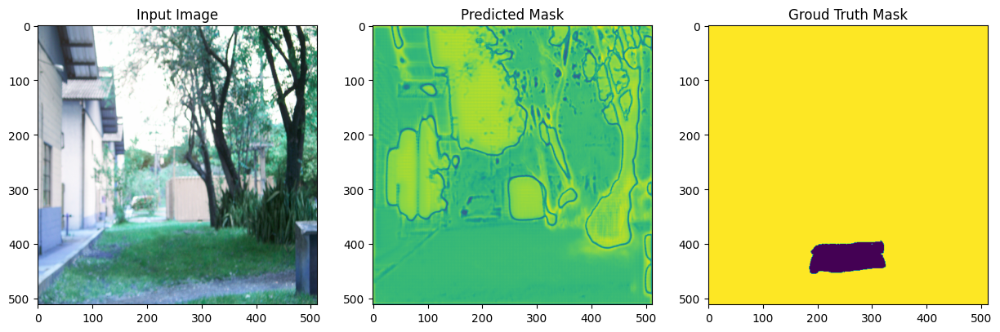

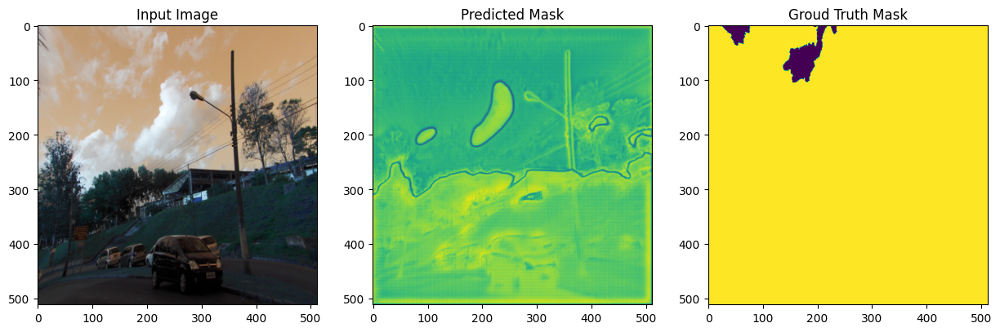

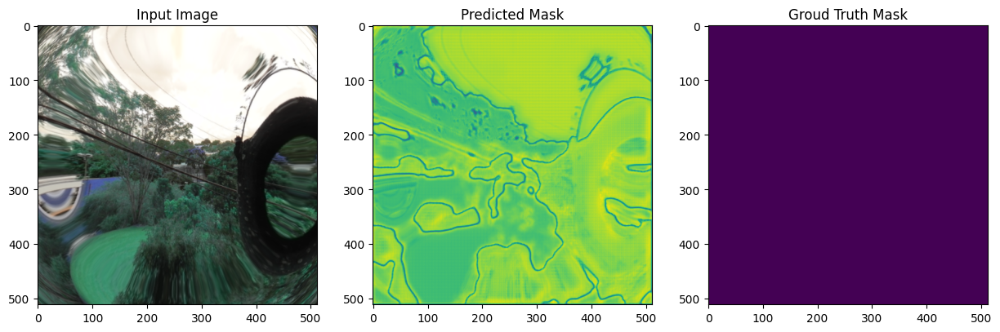

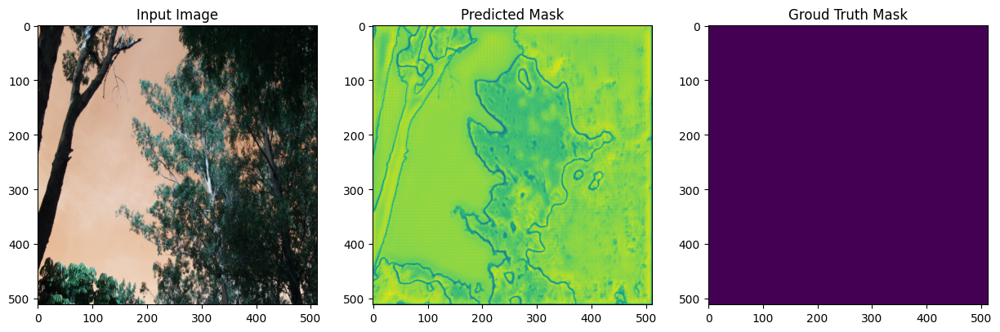

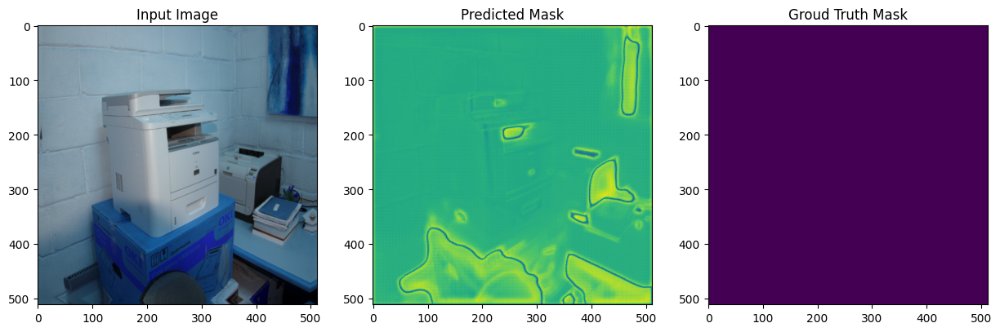

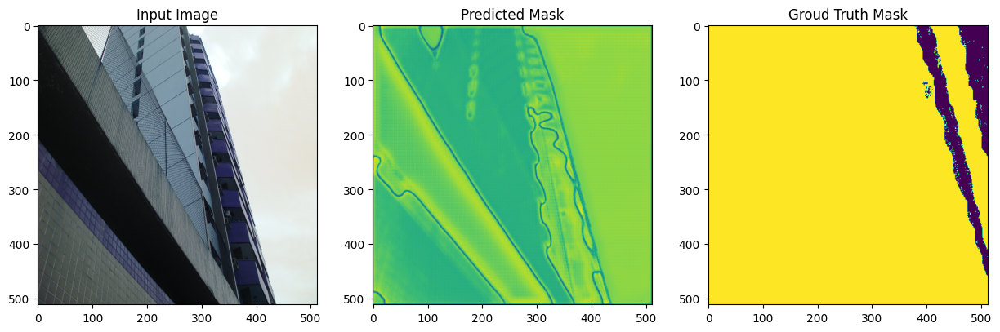

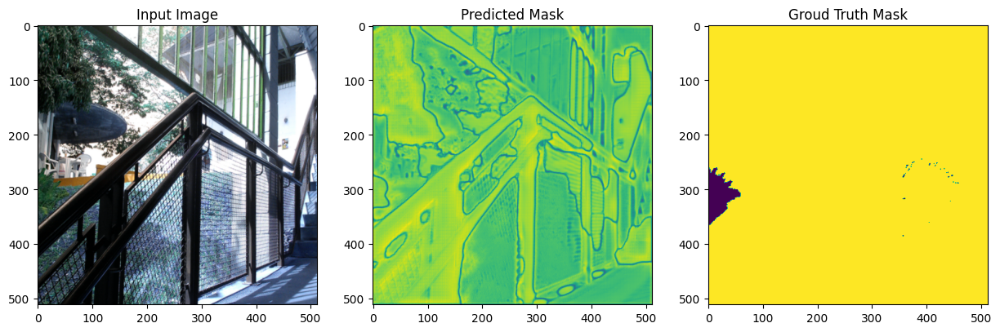

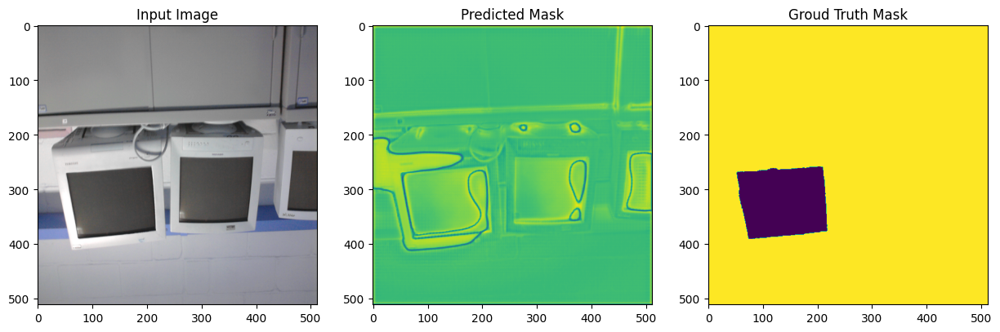

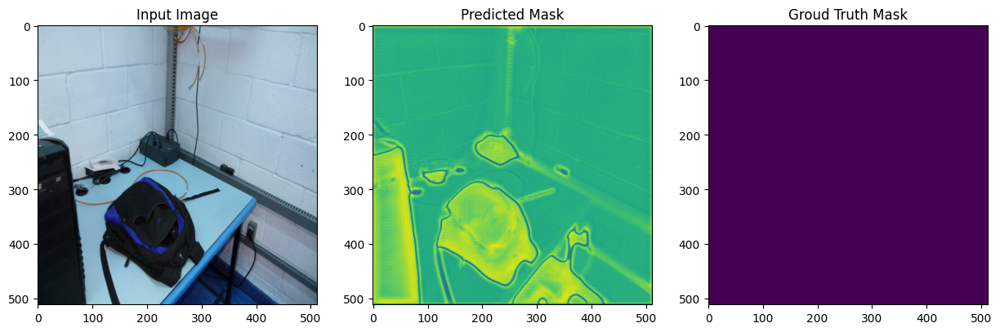

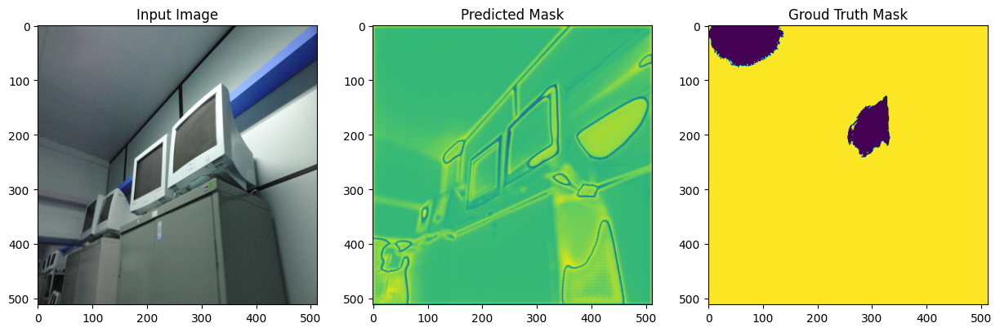

In [ ]:
"""This function prints the input image,its ground truth mask along with predicted mask
        model_path : Takes the path of trianed model
        split_data_df : Takes the pd.DataFrame object that should contain image path and mask path in X and Y named columns
        show_images : number of random images that should sampled from "split_data_df"
    """
    model_path='trained_models/model_unet.h5'
    split_data_df =test_data
    show_images=10

    samples = split_data_df.sample(n=show_images)
    model = load_model(model_path)
    input_img = []
    GT_mask = []
    Predicted_mask = []
    for index,row in samples.iterrows():
        image = load_img(row['X'])
        image_arr = img_to_array(image)
        image_arr=np.array(image_arr).reshape(-1, 512, 512, 3)/255
        mask = imread(row['y'])
        output = model.predict(image_arr).reshape(512, 512)
        input_img.append(image)
        GT_mask.append(mask)
        Predicted_mask.append(output)

    for i in range(show_images):
        fig, ax = plt.subplots(1,3,figsize=(15, 10))
        ax[0].imshow(input_img[i])
        ax[0].set_title("Input Image")
        ax[1].imshow(Predicted_mask[i])
        ax[1].set_title("Predicted Mask")
        ax[2].imshow(GT_mask[i])
        ax[2].set_title("Groud Truth Mask")

In [ ]:
def data_gen_fk(data):
    data_reduced = data[data['y']!='default.mask.png']
    while True:
        for start in range(0, data_reduced.shape[0], batch_size):
            x_batch = []
            y_batch = []
            end = min(start + batch_size, data_reduced.shape[0])
            x_data_batch = data_reduced.iloc[start:end]

            for index,row in x_data_batch.iterrows():
                image = load_img(row['X'])
                image = img_to_array(image)
                mask = imread(row['y'])
                mask= img_to_array(mask,dtype=np.uint8)
                x_batch.append(image)
                y_batch.append(mask)

            x_batch = np.array(x_batch).reshape(-1, 512, 512, 3)/255
            y_batch = np.array(y_batch)/255

            yield x_batch, y_batch


In [ ]:
checkPoint_path = "model_checkpoints/model_unet_fk/"
filepath= checkPoint_path+"weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"

checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

log_dir = "C:\\logs\\model_unet_fk\\" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=3)

callbacks_list = [checkpoint,tensorboard_callback]

In [ ]:
input_img = Input((512, 512, 3))
model_unet_2 = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)

model_unet_2.compile(optimizer='adam', loss="binary_crossentropy", metrics=["accuracy"])
#model_unet_2.summary()

In [ ]:
batch_size = 16
max_epochs = 10
input_size = 512

history = model_unet_2.fit_generator(generator = data_gen_fk(train_data),
                    steps_per_epoch=16,
                    epochs=max_epochs,
                    validation_data=data_gen_fk(val_data),
                    callbacks=callbacks_list,
                    validation_steps=16)

Epoch 1/10
16/16 [==============================] - ETA: 0s - loss: 0.6491 - accuracy: 0.6798
Epoch 1: val_accuracy improved from -inf to 0.08410, saving model to model_checkpoints/model_unet_fk/weights-improvement-01-0.08.hdf5
16/16 [==============================] - 43s 2s/step - loss: 0.6491 - accuracy: 0.6798 - val_loss: 6034.7393 - val_accuracy: 0.0841
Epoch 2/10
16/16 [==============================] - ETA: 0s - loss: 0.4517 - accuracy: 0.9067
Epoch 2: val_accuracy did not improve from 0.08410
16/16 [==============================] - 22s 1s/step - loss: 0.4517 - accuracy: 0.9067 - val_loss: 3374.2380 - val_accuracy: 0.0680
Epoch 3/10
16/16 [==============================] - ETA: 0s - loss: 0.3735 - accuracy: 0.9278
Epoch 3: val_accuracy improved from 0.08410 to 0.47144, saving model to model_checkpoints/model_unet_fk/weights-improvement-03-0.47.hdf5
16/16 [==============================] - 21s 1s/step - loss: 0.3735 - accuracy: 0.9278 - val_loss: 73.3533 - val_accuracy: 0.4714
Ep

In [ ]:
model_unet_2.save('trained_models/model_unet_2.h5')

In [ ]:
test_loss_2,test_accuracy_2 = model_unet_2.evaluate_generator(data_gen_fk(test_data),steps=16,verbose=1)
val_loss_2,val_accuracy_2 = model_unet_2.evaluate_generator(data_gen_fk(val_data),steps=16,verbose=1)
train_loss_2,train_accuracy_2 = model_unet_2.evaluate_generator(data_gen_fk(train_data),steps=16,verbose=1)

16/16 [==============================] - 6s 359ms/step - loss: 0.3345 - accuracy: 0.9290


In [ ]:
print("Accuracy on TRAIN Data = {} \t Log-loss in TRAIN Data = {} ".format(train_accuracy_2,train_loss_2))
print("Accuracy on VALIDATION Data = {} \t Log-loss in VALIDATION Data = {} ".format(val_accuracy_2,val_loss_2))
print("Accuracy on TEST Data = {} \t Log-loss in TEST Data = {} ".format(test_accuracy_2,test_loss_2))

Accuracy on TRAIN Data = 0.9289771318435669 	 Log-loss in TRAIN Data = 0.334465354681015 
Accuracy on VALIDATION Data = 0.9220163822174072 	 Log-loss in VALIDATION Data = 0.34141793847084045 
Accuracy on TEST Data = 0.9400856494903564 	 Log-loss in TEST Data = 0.3213156461715698 


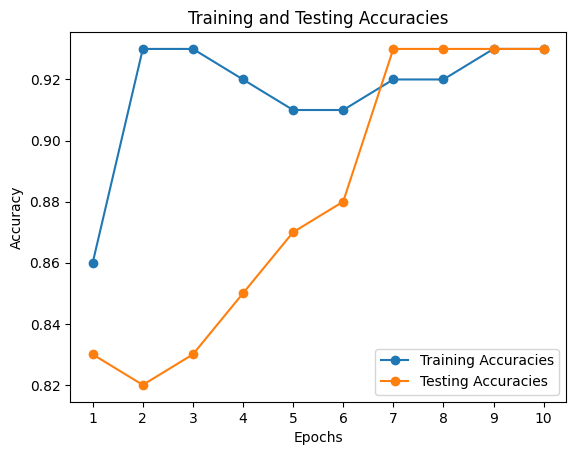

In [ ]:
import matplotlib.pyplot as plt

# Iterations or epochs
epochs = [1,2,3,4,5,6,7,8,9,10]

# Training accuracies
train_accuracies = [0.86, 0.93, 0.93, 0.92, 0.91, 0.91, 0.92, 0.92, 0.93, 0.93]

# Testing accuracies
test_accuracies = [0.83, 0.82, 0.83, 0.85, 0.87, 0.88, 0.93, 0.93, 0.93, 0.93]

# Create a line plot for training accuracies
plt.plot(epochs, train_accuracies, marker='o', label='Training Accuracies')

# Create a line plot for testing accuracies
plt.plot(epochs, test_accuracies, marker='o', label='Testing Accuracies')

# Set plot title and labels
plt.title('Training and Testing Accuracies')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Set x-axis ticks
plt.xticks(epochs)

# Add a legend
plt.legend()

# Display the plot
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_accuracy_and_loss(train_accuracy, val_accuracy, train_loss, val_loss):
    epochs = range(1, len(train_accuracy) + 1)

    # Plotting accuracy
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    sns.lineplot(epochs, train_accuracy, label='Training Accuracy')
    sns.lineplot(epochs, val_accuracy, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Accuracy vs. Epochs')
    plt.legend()

    # Plotting loss
    plt.subplot(1, 2, 2)
    sns.lineplot(epochs, train_loss, label='Training Loss')
    sns.lineplot(epochs, val_loss, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Loss vs. Epochs')
    plt.legend()

    # Adjusting subplot spacing
    plt.tight_layout()

    # Display the plot
    plt.show()

In [ ]:
import matplotlib.pyplot as plt

def plot_accuracy_and_loss(train_accuracy, val_accuracy, train_loss, val_loss):
    epochs = range(1, len(train_accuracy) + 1)

    # Plotting accuracy
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_accuracy_2, 'r', label='Training Accuracy')
    plt.plot(epochs, val_accuracy_2, 'b', label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Accuracy vs. Epochs')
    plt.legend()

    # Plotting loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_loss_2, 'r', label='Training Loss')
    plt.plot(epochs, val_loss_2, 'b', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Loss vs. Epochs')
    plt.legend()

    # Adjusting subplot spacing
    plt.tight_layout()

    # Display the plot
    plt.show()

In [ ]:
plt.show()

In [ ]:
print_results(model_path='trained_models/model_unet_2.h5',
              split_data_df =test_data[test_data['y']!='default.mask.png'],show_images=10)
